<a href="https://colab.research.google.com/github/prcm066/cancer_detection_example/blob/main/DataVizFinalProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project Report: Climate Change Indicators Visualization

## Introduction

The purpose of the visualizations is to get a deeper understanding of the temperature changes at a global scale. The dataset we are going to use tracks annual temperature changes (°C) for countries worldwide from 1961 to 2022. Key columns include Country, ISO3, and yearly values (e.g., F1961, F2022).

Our main objetctives are:

* Visualize temperature trends over time for top-affected countries.

* Compare national trends against the global average.

* Highlight geospatial patterns and temporal anomalies.


The specific tasks we want to tackle are:

Identify countries with the highest cumulative temperature change.
Analyze year-to-year fluctuations and long-term trends.
Explore regional disparities via an interactive map.

## Loading the data and generating the visualizations

We first load the dataframe shape and look at the columns to uderstand the structure

In [ ]:
r

In [11]:
import pandas as pd
import plotly.graph_objs as go
import plotly.io as pio

# Read the CSV data
!unzip archive.zip
file = '/content/climate_change_indicators.csv'
df = pd.read_csv(file)
print("Dimensions", df.shape)
df.head()

Archive:  archive.zip
replace climate_change_indicators.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
  inflating: climate_change_indicators.csv  
Dimensions (225, 72)


,ObjectId,Country,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_Full_Descriptor,...,F2013,F2014,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022
0,1,"Afghanistan, Islamic Rep. of",AF,AFG,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.281,0.456,1.093,1.555,1.540,1.544,0.910,0.498,1.327,2.012
1,2,Albania,AL,ALB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.333,1.198,1.569,1.464,1.121,2.028,1.675,1.498,1.536,1.518
2,3,Algeria,DZ,DZA,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.192,1.690,1.121,1.757,1.512,1.210,1.115,1.926,2.330,1.688
3,4,American Samoa,AS,ASM,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.257,1.170,1.009,1.539,1.435,1.189,1.539,1.430,1.268,1.256
4,5,"Andorra, Principality of",AD,AND,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,0.831,1.946,1.690,1.990,1.925,1.919,1.964,2.562,1.533,3.243


## Generating Visualizations

In [12]:

# Melt the dataframe to convert years to a long format
df_melted = df.melt(
    id_vars=['Country', 'ISO3'],
    value_vars=[f'F{year}' for year in range(1961, 2023)],
    var_name='Year',
    value_name='Temperature_Change'
)

# Clean up the year column
df_melted['Year'] = df_melted['Year'].str.replace('F', '').astype(int)

# Calculate global average
global_avg = df_melted.groupby('Year')['Temperature_Change'].mean().reset_index()

# Select top 10 countries with highest temperature change
top_countries = df_melted.groupby('Country')['Temperature_Change'].sum().nlargest(10).index

# Create line plot for temperature change
fig1 = go.Figure()

# Add lines for top countries
for country in top_countries:
    country_data = df_melted[df_melted['Country'] == country]
    fig1.add_trace(go.Scatter(
        x=country_data['Year'],
        y=country_data['Temperature_Change'],
        mode='lines',
        name=country
    ))

# Add global average line
fig1.add_trace(go.Scatter(
    x=global_avg['Year'],
    y=global_avg['Temperature_Change'],
    mode='lines',
    name='Global Average',
    line=dict(color='red', width=3)
))

fig1.update_layout(
    title='Temperature Change by Top Countries (1961-2022)',
    xaxis_title='Year',
    yaxis_title='Temperature Change (°C)',
    height=600,
    width=1000
)

# Create bar chart for total temperature change
total_change = df_melted.groupby('Country')['Temperature_Change'].sum().nlargest(10)
fig2 = go.Figure(data=[
    go.Bar(
        x=total_change.index,
        y=total_change.values,
        text=[f'{val:.2f}' for val in total_change.values],
        textposition='auto'
    )
])

fig2.update_layout(
    title='Top 10 Countries - Total Temperature Change',
    xaxis_title='Country',
    yaxis_title='Total Temperature Change (°C)',
    height=600,
    width=1000
)

# Save the visualizations
pio.write_html(fig1, file='temperature_change_line_chart.html')
pio.write_html(fig2, file='total_temperature_change_bar_chart.html')

# Print some insights
print("\nInsights:")
print(f"Global Average Temperature Change: {global_avg['Temperature_Change'].mean():.2f}°C")
print(f"Total Number of Countries: {df['Country'].nunique()}")
print("\nTop 5 Countries with Highest Total Temperature Change:")
print(total_change.head())


Insights:
Global Average Temperature Change: 0.51°C
Total Number of Countries: 225

Top 5 Countries with Highest Total Temperature Change:
Country
Mongolia                       55.527
Mauritania, Islamic Rep. of    55.403
Austria                        50.181
Western Sahara                 49.944
Finland                        49.211
Name: Temperature_Change, dtype: float64


In [13]:
fig1

In [14]:
fig2

In [15]:
import pandas as pd
import altair as alt
alt.data_transformers.disable_max_rows()
# Load data
df = pd.read_csv(file)

# Melt data to long format
df_melted = df.melt(
    id_vars=['Country', 'ISO3', 'Indicator'],
    value_vars=[f'F{year}' for year in range(1961, 2023)],
    var_name='Year',
    value_name='Temperature_Change'
).dropna()

# Clean year column
df_melted['Year'] = df_melted['Year'].str.replace('F', '').astype(int)

# Create a selection for countries
selection = alt.selection_point(
    fields=['Country'],
    bind=alt.binding_select(options=df_melted['Country'].unique().tolist(), name='Select Country:'),
    value=[{'Country': 'Argentina'}]
)

# Line chart
line_chart = alt.Chart(df_melted).mark_line().encode(
    x='Year:O',
    y='Temperature_Change:Q',
    color='Country:N',
    tooltip=['Country', 'Year', 'Temperature_Change']
).add_params(selection).transform_filter(selection)

line_chart.properties(
    title='Temperature Change Over Time (Drill-Down by Country)',
    width=800,
    height=400
)

alt.Chart(...)

In [16]:
# Heatmap
heatmap = alt.Chart(df_melted).mark_rect().encode(
    x='Year:O',
    y='Country:N',
    color=alt.Color('Temperature_Change:Q', scale=alt.Scale(scheme='redblue', reverse=True)),
    tooltip=['Country', 'Year', 'Temperature_Change']
).properties(
    title='Temperature Change Heatmap',
    width=800,
    height=1000
)

heatmap

alt.Chart(...)

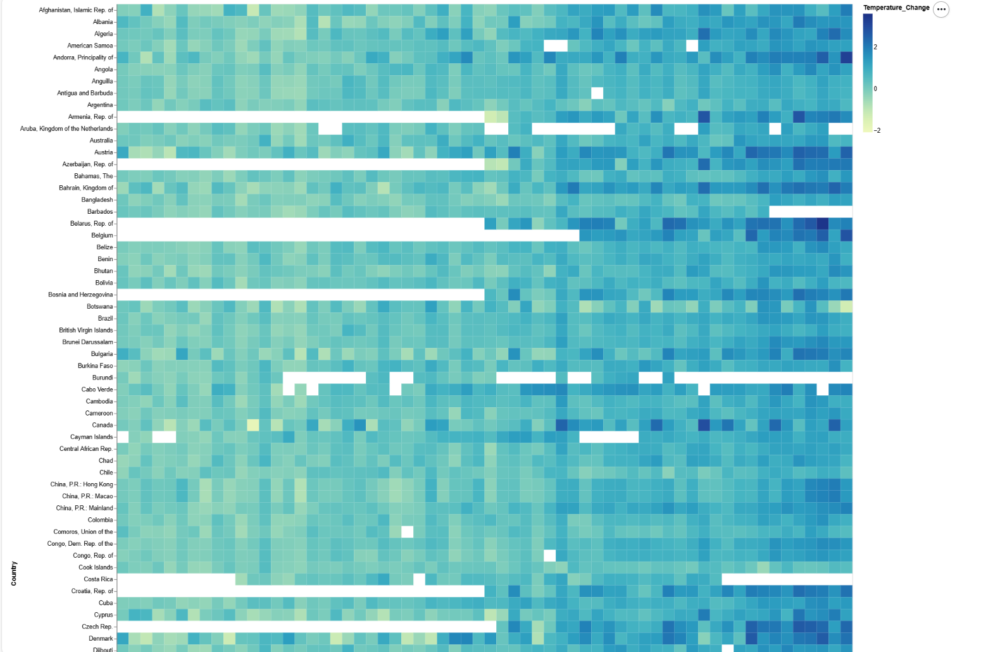

In [17]:
# Total temperature change per country
total_change = df_melted.groupby('Country')['Temperature_Change'].sum().reset_index()

# Define selection
selection = alt.selection_point(
    fields=['Country'],
    bind='legend',
    empty=False  )

# Bar chart with dynamic selection
bar = alt.Chart(total_change).mark_bar().encode(
    x=alt.X('Country:N', sort='-y'),
    y='Temperature_Change:Q',
    color=alt.condition(
        selection,
        alt.value('orange'),
        alt.value('steelblue')
    ),
    tooltip=['Country', 'Temperature_Change']
).properties(
    title='Total Temperature Change by Country (Click to Drill Down)',
    width=800,
    height=400
).add_params(selection)  # Add the selection parameter

# Line chart linked to bar selection
line = alt.Chart(df_melted).mark_line().encode(
    x='Year:O',
    y='Temperature_Change:Q',
    color='Country:N',
    tooltip=['Country', 'Year', 'Temperature_Change']
).transform_filter(
    selection  # Filter based on the selected country
)

# Combine charts
(bar & line).resolve_scale(color='independent')



alt.VConcatChart(...)

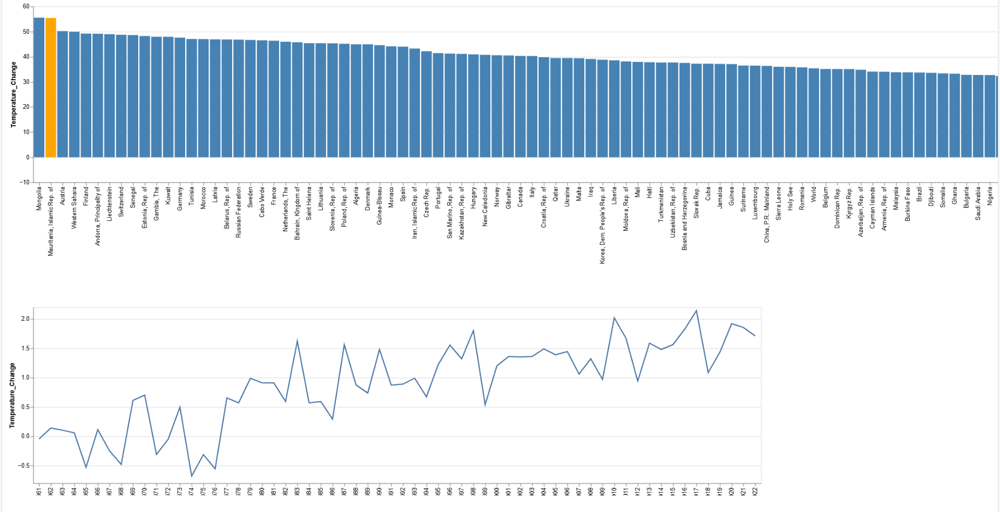

In [18]:
# Faceted line charts
alt.Chart(df_melted).mark_line().encode(
    x='Year:O',
    y='Temperature_Change:Q',
    color='Country:N',
    column=alt.Column('Country:N', header=alt.Header(labelOrient='bottom'))
).properties(
    width=50,
    height=100,
    title='Temperature Trends by Country (Small Multiples)'
)

alt.Chart(...)

In [19]:
!pip install vega_datasets

In [22]:
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go

# Read the CSV data
df = pd.read_csv(file)

# Melt the dataframe to convert years to a long format
df_melted = df.melt(
    id_vars=['Country', 'ISO3'],
    value_vars=[f'F{year}' for year in range(1961, 2023)],
    var_name='Year',
    value_name='Temperature_Change'
)

# Clean up the year column
df_melted['Year'] = df_melted['Year'].str.replace('F', '').astype(int)

# Create the interactive choropleth map
def create_temperature_map(selected_year):
    # Filter data for the selected year
    year_data = df_melted[df_melted['Year'] == selected_year]

    # Create the choropleth map
    fig = px.choropleth(
        year_data,
        locations='ISO3',
        color='Temperature_Change',
        hover_name='Country',
        color_continuous_scale='RdBu_r',  # Red-Blue diverging scale (reversed)
        color_continuous_midpoint=0,
        title=f'Global Temperature Change in {selected_year}',
        labels={'Temperature_Change': 'Temperature Change (°C)'}
    )

    fig.update_layout(
        height=600,
        width=1000,
        geo=dict(
            showframe=False,
            showcoastlines=True,
            projection_type='equirectangular'
        )
    )

    return fig

# Create an interactive figure with a slider
years = sorted(df_melted['Year'].unique())
fig = go.Figure(
    data=[create_temperature_map(year).data[0] for year in years],
    layout=go.Layout(
        updatemenus=[{
            'buttons': [
                {
                    'method': 'animate',
                    'label': 'Play',
                    'args': [None, {'frame': {'duration': 300, 'redraw': True}, 'fromcurrent': True}]
                },
                {
                    'method': 'animate',
                    'label': 'Pause',
                    'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate', 'transition': {'duration': 0}}]
                }
            ],
            'direction': 'left',
            'pad': {'r': 10, 't': 87},
            'showactive': False,
            'type': 'buttons',
            'x': 0.1,
            'xanchor': 'right',
            'y': 0,
            'yanchor': 'top'
        }],
        sliders=[{
            'active': 0,
            'yanchor': 'top',
            'xanchor': 'left',
            'currentvalue': {
                'font': {'size': 20},
                'prefix': 'Year: ',
                'visible': True,
                'xanchor': 'right'
            },
            'transition': {'duration': 300, 'easing': 'cubic-in-out'},
            'pad': {'b': 10, 't': 50},
            'len': 0.9,
            'x': 0.1,
            'y': 0,
            'steps': [
                {
                    'method': 'animate',
                    'label': str(year),
                    'args': [[str(year)], {'frame': {'duration': 300, 'redraw': True}, 'mode': 'immediate'}]
                } for year in years
            ]
        }]
    )
)

# Add frames for animation
frames = [go.Frame(data=[create_temperature_map(year).data[0]], name=str(year)) for year in years]
fig.frames = frames

# Save the interactive map
fig.write_html('global_temperature_change_map.html')

# Print some additional insights
print("\nMap Insights:")
print(f"Years covered: {min(years)} - {max(years)}")
print(f"Total number of countries: {df['Country'].nunique()}")

# Calculate some global statistics
global_stats = df_melted.groupby('Year')['Temperature_Change'].agg(['mean', 'min', 'max']).reset_index()
print("\nGlobal Temperature Change Statistics:")
print(global_stats)


Map Insights:
Years covered: 1961 - 2022
Total number of countries: 225

Global Temperature Change Statistics:
    Year      mean    min    max
0   1961  0.163053 -0.694  1.892
1   1962 -0.013476 -0.908  0.998
2   1963 -0.006043 -1.270  1.202
3   1964 -0.070059 -0.877  1.097
4   1965 -0.247027 -1.064  0.857
..   ...       ...    ...    ...
57  2018  1.302113  0.238  2.772
58  2019  1.443061  0.050  2.689
59  2020  1.552038  0.229  3.691
60  2021  1.343531 -0.425  2.676
61  2022  1.382113 -1.305  3.243

[62 rows x 4 columns]


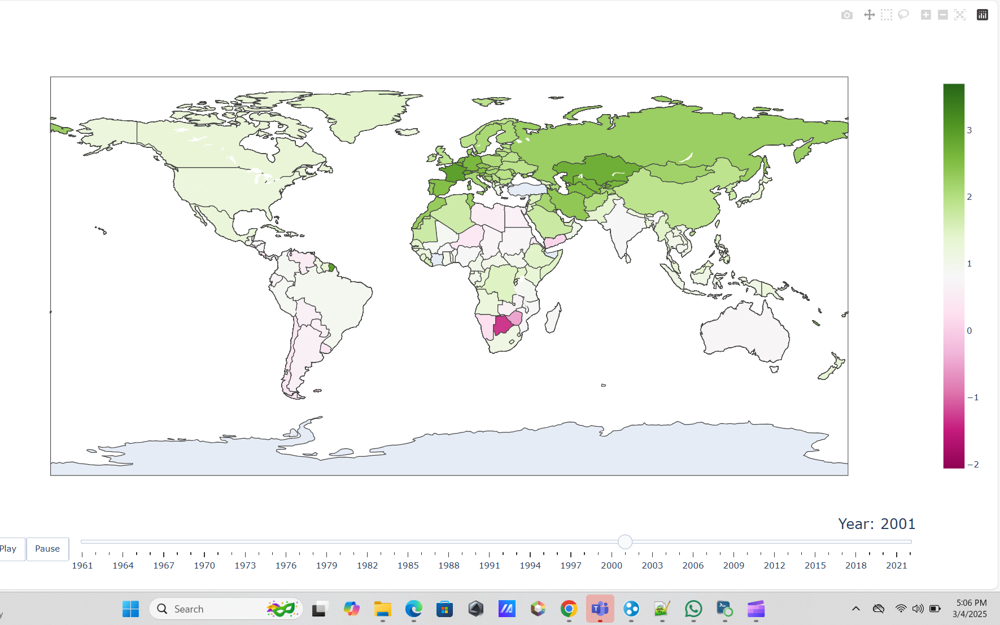

## Design amd Justification

* **Line Charts:** Chosen for temporal trend clarity. Global average (red line) added for benchmarking.

* **Bar Charts:** Simplified comparison of cumulative impact.

* **Heatmap:** Reveals country-year anomalies (e.g., spikes in specific years).

* **Choropleth Map:** Provides geospatial context with a slider for temporal exploration.

* **Interactivity:** Dropdowns and sliders added to reduce clutter and enable user-driven exploratio

## Evaluation
Participants: Three acquaintances with varying degrees of numeric literacy from medium to very high.

#### Tasks:

* Identify the country with the steepest temperature rise using the line chart.

* Compare regional trends via the choropleth map.

* Critique usability and clarity of visuals.

#### Feedback Summary:

**Participant 1**

Strengths: Choropleth slider effectively shows temporal shifts.

Improvements: Line chart overcrowded; add highlighting or toggle options.

**Participant 2**

Strengths: Global average contextualizes national trends.

Improvements: Heatmap color legend unclear; add labels.

**Participant 3**

Strengths: Bar chart’s clean design aids quick comparison.

Improvements: Small multiples are too small; increase size, simplify or remove altogether

# Summary and Comclusion
**What went well:**

* Interactivity (sliders, tooltips) enhanced engagement and exploration.

* Global average line provided critical context in trend analysis.

**What need improvement**

* Clutter: Simplify line charts by defaulting to top 5 countries or adding filters.

* Readability: Improve heatmap legends and small multiples scaling.

* Usability: Optimize choropleth slider responsiveness for smoother transitions.

**Changes**

Initial static charts evolved to include interactivity (sliders, dropdowns) after feedback.

Added small multiples and heatmaps to address requests for granularity.

Develop a dashboard consolidating all visuals with synchronized filters.

Conduct A/B testing on color scales and default views.